In [3]:
import sys
sys.path.append('..')
from tool import *
mt=[]
for month in range(1,13):
    now=datetime.datetime.strptime(f'2001-{month}-1', '%Y-%m-%d')
    month_time=(now+relativedelta(months=1)-now).total_seconds()
    mt.append(month_time)
mt=np.array(mt)

2001 albedo2: 0.24984973484379208
2010 albedo2: 0.25142023079272996
0.0015704959489378778
2001-2020 change2:  0.6285761919738533 %


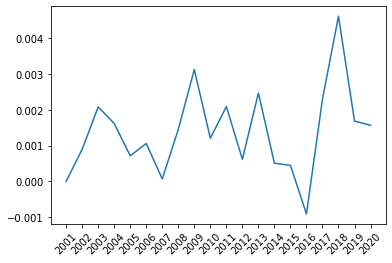

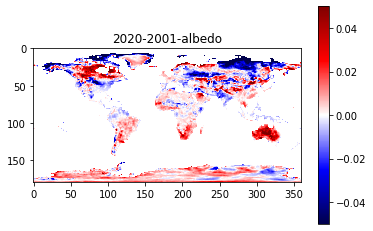

In [4]:
def month_fill(data,mask):
    data_mean=np.nanmean(data,axis=0)
    for i in range(12):
        data[i][mask[i]]=data_mean[mask[i]]
    return data
from tool import *
stat=torch.load(f'/data/hk/albedo/stat_sw-mean_sza-70_band-shortwave_kernel2.pth')
_,sza_L=torch.load(root_path+'sza_and_szaL.pth')


albedo_all=np.zeros((12,20,18,180,360)).astype(np.float32)
area_all=np.zeros((12,20,18,180,360)).astype(np.float32)
mask=np.zeros((12,20,18,180,360))

for y in range(2001,2021):
    for m in range(1,13):
        albedo_all[m-1,y-2001]=stat[f'{y}-{m}-albedo']
        area_all[m-1,y-2001]=stat[f'{y}-{m}-typearea']
        mask[m-1,y-2001]=np.expand_dims(sza_L[y-2001,m-1],0).repeat(18,axis=0)
# albedo_all=month_fill(albedo_all,mask>=1)
albedo_all[albedo_all==0]=np.nan
albedo_all[mask>=1]=np.nan
area_all=month_fill(area_all,mask>=1)
albedo_all=month_fill(albedo_all,mask>=1)


albedo_y_list2=[]
for y in range(2001,2021):
    z=area_all[:,y-2001]*albedo_all[:,y-2001]
    z[np.isnan(z)]=0
    z=mt.reshape(12,1,1,1)*z/365/24/3600
    z=np.nansum(z,axis=0)
    z2=np.nansum(z,axis=0)
    z3=np.nansum(z2)/np.sum(stat[f'{y}-landarea'])
    albedo_y_list2.append(z3)
print(f'2001 albedo2: {albedo_y_list2[0]}')
print(f'2010 albedo2: {albedo_y_list2[19]}')
print(albedo_y_list2[19]-albedo_y_list2[0])
print(f'2001-2020 change2: ',((albedo_y_list2[-1]-albedo_y_list2[0])/albedo_y_list2[0])*100,'%')
plt.plot([str(i) for i in range(2001,2021)],[albedo_y_list2[i]-albedo_y_list2[0] for i in range(20)])
plt.xticks(rotation=45)
plt.show()




zz=[]
for y in range(2001,2021):
    z=area_all[:,y-2001]*albedo_all[:,y-2001]
    z[np.isnan(z)]=0
    z=mt.reshape(12,1,1,1)*z/365/24/3600
    z=np.nansum(z,axis=0)

    
    # z[z==0]=np.nan
    z2=np.nansum(z,axis=0)
    a=np.mean(area_all[:,y-2001],axis=0)
    a=np.sum(a,axis=0)
    z3=z2/a
    zz.append(z3)
# plt.figure(figsize=(30,20))
zz2020=zz[-1]
zz2001=zz[0]
zz2020[zz2001==0]=0
zz2001[zz2020==0]=0
plt.title(f'2020-2001-albedo')
plt.imshow(zz2020-zz2001,vmax=0.05,vmin=-0.05,cmap='seismic')
plt.colorbar()
plt.show()


In [5]:
#绘制曲线
from tool import *
stat=torch.load(f'/data/hk/albedo/stat_sw-mean_sza-70_band-shortwave_kernel2.pth')
_,sza_L=torch.load(root_path+'sza_and_szaL.pth')


albedo_all=np.zeros((12,20,18,180,360)).astype(np.float32)
area_all=np.zeros((12,20,18,180,360)).astype(np.float32)
mask=np.zeros((12,20,18,180,360))

for y in range(2001,2021):
    for m in range(1,13):
        albedo_all[m-1,y-2001]=stat[f'{y}-{m}-albedo']
        area_all[m-1,y-2001]=stat[f'{y}-{m}-typearea']
        mask[m-1,y-2001]=np.expand_dims(sza_L[y-2001,m-1],0).repeat(18,axis=0)
# albedo_all=month_fill(albedo_all,mask>=1)
albedo_all[albedo_all==0]=np.nan
albedo_all[mask>=1]=np.nan
area_all=month_fill(area_all,mask>=1)
albedo_all=month_fill(albedo_all,mask>=1)    
season=[]
z=[]
aa=area_all*albedo_all
aa[aa==0]=np.nan
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):
        tt=[np.nansum(aa[i-1,year-2001,:,24:90-23,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,24:90-23,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]

print(stds[-1]/2)
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,24:90-23,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,24:90-23,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
plt.figure(figsize=(20,11),dpi=600)
# plt.plot(list(range(2001,2021)),[0]*20,color='#999999',alpha=1,linewidth=1.3)



plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#FA7F6F',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#FA7F6F',alpha=0.7,linewidth=3,label='Temperate Northern Hemisphere')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#FA7F6F',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.2048, Slope = -0.00003 year${^{-1}}$',[9,0],fontsize=20,color='#FA7F6F',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.025*10)/3.14159*180)
 







season=[]
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):
        tt=[np.nansum(aa[i-1,year-2001,:,90-23:90+23,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,90-23:90+23,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]

print(stds[-1]/2)
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,90-23:90+23,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,90-23:90+23,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())

kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))

plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='royalblue',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#82B0D2',alpha=1,linewidth=3,label='Tropical')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='royalblue',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.1669, Slope = 0.00012 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.025/50],fontsize=20,color='royalblue',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.025*10)/3.14159*180)



season=[]
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):
        tt=[np.nansum(aa[i-1,year-2001,:,90+23:-24,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,90+23:-24,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]

print(stds[-1]/2)

kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,90+23:-24,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,90+23:-24,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#8ECFC9',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#8ECFC9',alpha=0.7,linewidth=3,label='Temperate Southern Hemisphere')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#8ECFC9',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.1574, Slope = 0.0002 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.025/50],fontsize=20,color='#8ECFC9',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.025*10)/3.14159*180)
# plt.show()






plt.grid(linestyle='-.')
plt.legend(fontsize=20)
plt.xlim(('2001', '2020'))
plt.ylim((-0.004, 0.017))
plt.xticks(fontsize=20,rotation=45)
plt.yticks(fontsize=20)
# plt.annotate('2001 Albedo = 0.2200, Slope = 0.00004 $ {y^{-1}}$',[11,0.000],fontsize=20,color='#FA7F6F',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1669, Slope = 0.00012 $ {y^{-1}}$',[11,0.001],fontsize=20,color='royalblue',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1579, Slope = 0.00019 $ {y^{-1}}$',[11,0.008],fontsize=20,color='#8ECFC9',rotation=0.0050*1200)
# plt.annotate('2001 Albedo = 0.1938, Slope = 0.00008 $ {y^{-1}}$',[11,0.003],fontsize=20,color='black',rotation=8.42030838e-05*36000)


plt.ylabel(r'short wave $\Delta \alpha$ ',fontsize=20)
# plt.title('2001-2020 yearly albedo',fontsize=20)
plt.savefig('../figure/albedo_sw_kernel_gai.png',dpi=600)
plt.show()



0.0009492997628157023
0.20420876049682304 0.20477882692620875 0.0005700664293857016
(0, 0.7702877264736667, -2.5225286363409636e-05, -0.29199855803537256, [array([-2.52252864e-05]), 0.0016197781283891423])
0.0002614770768502651
0.16686625962022367 0.16994564430428863 0.003079384684064962
(1, 0.002054718976131742, 0.00012417960890848584, 3.082207001484488, [array([0.00012418]), 0.0006926027872002766])
0.0009979413600169366
0.15665210506255217 0.17124097405251898 0.014588868989966808
(0, 0.2561449666035265, 0.00020666793023594275, 1.1355499479153377, [array([0.00020667]), 0.005129893027878509])


In [6]:

plt.figure(figsize=(20,11),dpi=600) 
season=[]
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):

        tt=[np.nansum(aa[i-1,year-2001,:,:24,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,:24,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]
print(stds[-1]/2)
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,:24,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,:24,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
    
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#FA7F6F',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#FA7F6F',alpha=0.7,linewidth=3,label='The North Frigid zone')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#FA7F6F',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.4026, Slope = -0.00033 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*18+mk(kk, alpha=0.05)[4][1]+0.025/50],fontsize=20,color='#FA7F6F',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.025*10)/3.14159*120)






season=[]
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):
        tt=[np.nansum(aa[i-1,year-2001,:,-24:,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,-24:,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]
print(stds[-1]/2)
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,-24:,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,-24:,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#8ECFC9',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#8ECFC9',alpha=0.7,linewidth=3,label='The South Frigid Zone')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#8ECFC9',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.81, Slope = 0.0003 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.02/30],fontsize=20,color='#8ECFC9',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.025*10)/3.14159*130)


plt.grid(linestyle='-.')
plt.legend(fontsize=20)
plt.xlim(('2001', '2020'))
# plt.ylim((-0.004, 0.022))
plt.xticks(fontsize=20,rotation=45)
plt.yticks(fontsize=20)
# plt.annotate('2001 Albedo = 0.2200, Slope = 0.00004 $ {y^{-1}}$',[11,0.000],fontsize=20,color='#FA7F6F',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1669, Slope = 0.00012 $ {y^{-1}}$',[11,0.001],fontsize=20,color='royalblue',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1579, Slope = 0.00019 $ {y^{-1}}$',[11,0.008],fontsize=20,color='#8ECFC9',rotation=0.0050*1200)
# plt.annotate('2001 Albedo = 0.1938, Slope = 0.00008 $ {y^{-1}}$',[11,0.003],fontsize=20,color='black',rotation=8.42030838e-05*36000)


plt.ylabel(r'short wave $\Delta \alpha$ ',fontsize=20)
# plt.title('2001-2020 yearly albedo',fontsize=20)
plt.savefig('../figure/albedo_ns_frigid_zone_kernel_gai.pdf',dpi=600)
plt.show()

0.00044666012071017865
0.402567052934671 0.38206651418405524 -0.02050053875061575
(0, 0.2561449666035265, -0.0003335773603569298, -1.1355499479153377, [array([-0.00033358]), -0.005465431245936991])
0.0006740529033742534
0.810021282527545 0.8142266051207054 0.004205322593160421
(1, 0.0003166110130958799, 0.0003021035015822048, 3.6013155491029285, [array([0.0003021]), -0.0024051740844963183])


In [7]:
#雪面积与反照率相关系数（去趋势）
#雪面积和反照率都使用70度的阈值
area_m=np.nansum(area_all,axis=3)
area_m=np.nansum(area_m,axis=3)
area=np.nanmean(area_m,axis=0)
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,:,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,:,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
np.corrcoef([area[i+1,17]-area[i,17] for i in range(19)],[kk2[i+1]-kk2[i] for i in range(19)])

array([[1.     , 0.93474],
       [0.93474, 1.     ]])

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from tool import *
np.array([ 0.      , -0.17846 , -0.00526 ,  0.062328, -0.197714, -0.175554,
       -0.547536, -0.283216, -0.0315  , -0.35955 , -0.005814, -0.38292 ,
        0.056822, -0.564444, -0.668928, -0.861052, -0.330262,  0.0602  ,
       -0.689216, -0.756984])
def linear_outlier_detection(data, threshold=1.5):
    # 构建线性回归模型
    X = np.arange(len(data)).reshape(-1, 1)
    y = np.array(data).reshape(-1, 1)
    model = LinearRegression().fit(X, y)
    
    # 计算残差
    residuals = np.abs(y - model.predict(X))
    
    # 根据阈值识别异常点
    outliers = np.where(residuals > threshold * np.std(residuals))[0]
    
    return outliers

# 示例数据
time_series_data = [ 0.      , -0.17846 , -0.00526 ,  0.062328, -0.197714, -0.175554,
       -0.547536, -0.283216, -0.0315  , -0.35955 , -0.005814, -0.38292 ,
        0.056822, -0.564444, -0.668928, -0.861052, -0.330262,  0.0602  ,
       -0.689216, -0.756984]

# 线性异常点检测
detected_outliers = linear_outlier_detection(time_series_data)
print("Detected outliers:", detected_outliers)
print([time_series_data[i] for i in detected_outliers])

In [9]:
from tool import *
data_m=torch.load('/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=1]=np.nan
data_m=month_fill(data_m,mask_t>=1)
data_y=np.nanmean(data_m,axis=0)
transf=np.nansum(data_y,axis=0)
transf=np.nansum(transf,axis=0)
dif_al=[]
for m in range(12):
    exp1_2020=np.expand_dims(albedo_all[m,-1],0).repeat(18,axis=0)
    exp0_2001=np.expand_dims(albedo_all[m,0],1).repeat(18,axis=1)
    dif_al_m=(exp1_2020-exp0_2001).transpose((2,3,0,1))*data_m[m]
    dif_al.append(dif_al_m*mt[m]/365/24/3600)
dif_al=np.stack(dif_al)
print('delta albedo:',np.nansum(dif_al)/np.sum(transf))
print('')
print('计算方法为和雪的扩张和收缩造成的albedo都归因于雪。')
print('type        nochange              add              sub               all')
temp=0
temp2=0
all=np.nansum(dif_al)
for t in range(18):

    if t==17:
        nc=np.nansum(dif_al[:,:,:,t,t])
        sub=np.nansum(dif_al[:,:,:,t])-nc
        add=np.nansum(dif_al[:,:,:,:,t])-nc
        print(type_code[t],'     ',
            to_str(nc/all*100,'%'),'     ',
            to_str((add+sub)/all*100,'%'),'     ',
            # to_str(sub/all*100,'%'),'     ',
            to_str((nc+(sub+add))/all*100,'%'),'     ',)
        temp2+=(sub+add)
    else:
        nc=np.nansum(dif_al[:,:,:,t,t])
        sub=np.nansum(dif_al[:,:,:,t,:-1])-nc
        add=np.nansum(dif_al[:,:,:,:-1,t])-nc
        print(type_code[t],'     ',
            to_str(nc/all*100,'%'),'     ',
            to_str((add+sub)/all*100,'%'),'     ',
            # to_str(sub/all*100,'%'),'     ',
            to_str((nc+(sub+add))/all*100,'%'),'     ',)
        temp2+=(sub+add)/2
    temp+=nc
print('')
print('nochange:',temp/np.sum(transf))
print('change:',(temp2)/np.sum(transf))
print('')
print('nochange except snow:',(temp-nc)/np.sum(transf))
print('change except snow:',(temp2-sub-add)/np.sum(transf))
print('')
print('nochanged snow:',nc/np.sum(transf))
print('changed snow:',(sub+add)/np.sum(transf))


delta albedo: 0.001570779

计算方法为和雪的扩张和收缩造成的albedo都归因于雪。
type        nochange              add              sub               all
EN_Forests                     2.98%          3.09%          6.07%         
EB_Forests                     -7.6%          5.22%          -2.38%        
DN_Forests                     -0.33%         -0.34%         -0.67%        
DB_Forests                     1.31%          1.52%          2.83%         
M_Forests                      4.38%          1.4%           5.78%         
C_Shrublands                   1.59%          2.12%          3.71%         
O_Shrublands                   64.26%         2.96%          67.22%        
W_Savannas                     7.16%          9.56%          16.72%        
Savannas                       14.89%         11.33%         26.23%        
Grasslands                     50.08%         13.89%         63.97%        
Permanent_Wetlands             1.67%          0.4%           2.06%         
Croplands                      16.2

In [10]:
kk=[[],[],[],[]]

data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=1]=np.nan
data_m=month_fill(data_m,mask_t>=1)
data_m[:,:,:,-1,:]=0
data_m[:,:,:,:,-1]=0
z=albedo_all[:,0].transpose((0,2,3,1)).reshape((12,180,360,18,1))*data_m
n=0
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    tt=[z[i-1,24:90-23] for i in month]
    mts=np.array([mt[i-1] for i in month]).reshape(3,1,1,1,1)
    tt=np.stack(tt)*mts/np.sum(mts)
    mm_area=np.array([np.nansum(data_m[i-1,24:90-23]) for i in month]).mean()
    kk[n].append(np.nansum(tt)/mm_area)
    n+=1
# [:,90+23:-24]

In [6]:
kk

[[0.1752053877383719],
 [0.1635849815137871],
 [0.16834703222633957],
 [0.17661534064660017]]

In [108]:
data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=1]=np.nan
data_m=month_fill(data_m,mask_t>=1)
data_m[:,:,:,-1,:]=0
data_m[:,:,:,:,-1]=0
z=albedo_all[:,0].transpose((0,2,3,1)).reshape((12,180,360,18,1))*data_m
z[np.isnan(z)]=0
z=z*(mt.reshape(12,1,1,1,1)/365/24/3600)
np.nansum(z[:,24:90-23])/np.nansum(np.nanmean(data_m[:,24:90-23],axis=0))


0.17049797777655876

In [113]:

season=[]
kk=[[0.1752053877383719],
 [0.1635849815137871],
 [0.16834703222633957],
 [0.17661534064660017]]
for y in range(2002,2021):
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    n=0
    for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
        tt=[z[i-1,24:90-23] for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(data_m[i-1,24:90-23]) for i in month]).mean()
        kk[n].append(np.nansum(tt)/mm_area)
        n+=1
# season=[]
for i in range(4):
    kk2=[0]+[kk[i][j]-kk[i][0] for j in range(1,20)]
    season.append(kk2)
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]


kk2=[0.17049797777655876]
for y in tqdm(range(2002,2021)):
    
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    z[np.isnan(z)]=0
    z=z*(mt.reshape(12,1,1,1,1)/365/24/3600)
    kk2.append(np.nansum(z[:,24:90-23])/np.nansum(np.nanmean(data_m[:,24:90-23],axis=0)))
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(stds[-1]/2)

print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))

plt.figure(figsize=(20,11),dpi=600)
# plt.plot(list(range(2001,2021)),[0]*20,color='#999999',alpha=1,linewidth=1.3)



plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#FA7F6F',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#FA7F6F',alpha=0.7,linewidth=3,label='Temperate Northern Hemisphere (no snow)')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#FA7F6F',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.1705, Slope = 0.00005 year${^{-1}}$',[9,0.0008],fontsize=20,color='#FA7F6F',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.019*10)/3.14159*180)






season=[]
kk=[[0.16698474404715252],
 [0.16662145512319065],
 [0.16637447952466344],
 [0.16703309530095362]]
for y in range(2002,2021):
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    n=0
    for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
        tt=[z[i-1,90-23:90+24] for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(data_m[i-1,90-23:90+24]) for i in month]).mean()
        kk[n].append(np.nansum(tt)/mm_area)
        n+=1
# season=[]
for i in range(4):
    kk2=[0]+[kk[i][j]-kk[i][0] for j in range(1,20)]
    season.append(kk2)
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]


kk2=[0.16675298477082404]
for y in tqdm(range(2002,2021)):
    
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    z[np.isnan(z)]=0
    z=z*(mt.reshape(12,1,1,1,1)/365/24/3600)
    kk2.append(np.nansum(z[:,90-23:90+24])/np.nansum(np.nanmean(data_m[:,90-23:90+24],axis=0)))
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(stds[-1]/2)

print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))

plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='royalblue',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#82B0D2',alpha=1,linewidth=3,label='Tropical (no snow)')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='royalblue',alpha=1,linewidth=1.5, linestyle='--')
plt.annotate('2001 Albedo = 0.1668, Slope = 0.00012 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.019/50],fontsize=20,color='royalblue',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.019*10)/3.14159*180)
 


season=[]
kk=[[0.15332827281481567],
 [0.14869437026749022],
 [0.1481278170242655],
 [0.154500847039972]]
for y in range(2002,2021):
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    n=0
    for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
        tt=[z[i-1,90+23:-24] for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(data_m[i-1,90+23:-24]) for i in month]).mean()
        kk[n].append(np.nansum(tt)/mm_area)
        n+=1
# season=[]
for i in range(4):
    kk2=[0]+[kk[i][j]-kk[i][0] for j in range(1,20)]
    season.append(kk2)
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]


kk2=[0.15116584351087992]
for y in tqdm(range(2002,2021)):
    
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    z[np.isnan(z)]=0
    z=z*(mt.reshape(12,1,1,1,1)/365/24/3600)
    kk2.append(np.nansum(z[:,90+23:-24])/np.nansum(np.nanmean(data_m[:,90+23:-24],axis=0)))
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
print(stds[-1]/2)

print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
plt.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='#8ECFC9',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
plt.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='#8ECFC9',alpha=0.7,linewidth=3,label='Temperate Southern Hemisphere (no snow)')
plt.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='#8ECFC9',alpha=1,linewidth=1.5, linestyle='--')
# plt.show()
plt.annotate('2001 Albedo = 0.1511, Slope = 0.00025 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.019/30],fontsize=20,color='#8ECFC9',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.019*10)/3.14159*180)






plt.grid(linestyle='-.')
plt.legend(fontsize=20)
plt.xlim(('2001', '2020'))
plt.ylim((-0.002, 0.017))
plt.xticks(fontsize=20,rotation=45)
plt.yticks(fontsize=20)
# plt.annotate('2001 Albedo = 0.2200, Slope = 0.00004 $ {y^{-1}}$',[11,0.000],fontsize=20,color='#FA7F6F',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1669, Slope = 0.00012 $ {y^{-1}}$',[11,0.001],fontsize=20,color='royalblue',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1579, Slope = 0.00019 $ {y^{-1}}$',[11,0.008],fontsize=20,color='#8ECFC9',rotation=0.0050*1200)
# plt.annotate('2001 Albedo = 0.1938, Slope = 0.00008 $ {y^{-1}}$',[11,0.003],fontsize=20,color='black',rotation=8.42030838e-05*36000)


plt.ylabel(r'short wave $\Delta \alpha$ ',fontsize=20)
# plt.title('2001-2020 yearly albedo',fontsize=20)
plt.savefig('./figure/albedo_sw_nts_nosnow_kernel2.pdf',dpi=600)
plt.show()

100%|██████████| 19/19 [01:16<00:00,  4.05s/it]


0.00017501470221656894
0.17049797777655876 0.1726886082470818 0.002190630470523036
(0, 0.2561449666035265, 4.7015354999722845e-05, 1.1355499479153377, [array([4.7015355e-05]), 0.0011903056118143089])


100%|██████████| 19/19 [01:17<00:00,  4.08s/it]


0.0002460909656605711
0.16675298477082404 0.16991289184231645 0.0031599070714924127
(1, 0.0006576543953178415, 0.000123707751611286, 3.4066498437460133, [array([0.00012371]), 0.0006112534274793195])


100%|██████████| 19/19 [01:16<00:00,  4.05s/it]


0.0011425938959520347
0.15116584351087992 0.16683827952178085 0.01567243601090093
(0, 0.2561449666035265, 0.00024966178098954564, 1.1355499479153377, [array([0.00024966]), 0.005772224053837])


In [112]:
0.1726886082470818-0.17049797777655876

0.002190630470523036

In [4]:
from tool import *
stat=torch.load(f'/data/hk/albedo/stat_sw-mean_sza-70_band-shortwave_kernel2.pth')
_,sza_L=torch.load(root_path+'sza_and_szaL.pth')


albedo_all=np.zeros((12,20,18,180,360)).astype(np.float32)
area_all=np.zeros((12,20,18,180,360)).astype(np.float32)
mask=np.zeros((12,20,18,180,360))

for y in range(2001,2021):
    for m in range(1,13):
        albedo_all[m-1,y-2001]=stat[f'{y}-{m}-albedo']
        area_all[m-1,y-2001]=stat[f'{y}-{m}-typearea']
        mask[m-1,y-2001]=np.expand_dims(sza_L[y-2001,m-1],0).repeat(18,axis=0)
# albedo_all=month_fill(albedo_all,mask>=1)
albedo_all[albedo_all==0]=np.nan
albedo_all[mask>=1]=np.nan
area_all=month_fill(area_all,mask>=1)
albedo_all=month_fill(albedo_all,mask>=1)    
season=[]
z=[]
aa=area_all*albedo_all
aa[aa==0]=np.nan



season=[]
for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
    # month=1
    kk=[]
    for year in range(2001,2021):
        tt=[np.nansum(aa[i-1,year-2001,:,:,:],axis=0) for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(area_all[i-1,year-2001,:,:,:]) for i in month]).mean()
        kk.append(np.nansum(tt)/mm_area)
    kk2=[0]+[kk[j]-kk[0] for j in range(1,len(kk))]
    season.append(kk2)
    
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]
kk2=[]
for y in range(2001,2021):
    ay=aa[:,y-2001,:,:,:]*mt.reshape(12,1,1,1)/365/24/3600
    zzz=[np.nansum(ay[m])/np.nansum(area_all[m,y-2001,:,:,:]) for m in range(12)]
    kk2.append(np.array(zzz).sum())
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
# print(mk(kk, alpha=0.05),'     ',kk2[0])
# plt.figure()
fig, ax1 = plt.subplots(figsize=(20,11),dpi=600)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation=45)
ax2 = ax1.twinx()
# plt.plot(list(range(2001,2021)),[0]*20,color='#999999',alpha=1,linewidth=1.3)

print(mann_kendall_test(kk2))
print(stds[-1]/2)
print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
ax1.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='thistle',alpha=0.6)
ax1.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
ax1.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='plum',alpha=0.7,linewidth=3,label='Global albedo')
ax1.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='mediumorchid',alpha=1,linewidth=1.5, linestyle='--')
ax1.annotate('2001 Albedo = 0.2502, Slope = 0.00005 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.011/50],fontsize=20,color='mediumorchid',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.011*10)/3.14159*180)



####################################
season=[]
kk=[[0.16995821684121826],
 [0.1620456693166442],
 [0.16548801987720624],
 [0.17035025247233082]]
for y in range(2002,2021):
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    n=0
    for month in [[3,4,5],[6,7,8],[9,10,11],[12,1,2]]:
        tt=[z[i-1] for i in month]
        mts=np.array([mt[i-1] for i in month]).reshape(3,1,1,1,1)
        tt=np.stack(tt)*mts/np.sum(mts)
        mm_area=np.array([np.nansum(data_m[i-1]) for i in month]).mean()
        kk[n].append(np.nansum(tt)/mm_area)
        n+=1
# season=[]
for i in range(4):
    kk2=[0]+[kk[i][j]-kk[i][0] for j in range(1,20)]
    season.append(kk2)
stds=[np.std([season[0][i],season[1][i],season[2][i],season[3][i]]) for i in range(20)]


kk2=[0.16679990693607497]
for y in tqdm(range(2002,2021)):
    
    data_m=torch.load(f'/data/hk/albedo/confuse_matrix/confuse_matrix_{y}.pth')
    mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
    data_m[mask_t>=1]=np.nan
    data_m=month_fill(data_m,mask_t>=1)
    data_m[:,:,:,-1,:]=0
    data_m[:,:,:,:,-1]=0
    z=albedo_all[:,y-2001].transpose((0,2,3,1)).reshape((12,180,360,1,18))*data_m
    z[np.isnan(z)]=0
    z=z*(mt.reshape(12,1,1,1,1)/365/24/3600)
    kk2.append(np.nansum(z)/np.nansum(np.nanmean(data_m,axis=0)))
kk=[0]+[kk2[j]-kk2[0] for j in range(1,len(kk2))]
# print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
# print(mk(kk, alpha=0.05))
# plt.figure(figsize=(20,11),dpi=600)
# plt.plot(kk2)


########################################
print(mann_kendall_test(kk2))
print(stds[-1]/2)

print(kk2[0],kk2[-1],kk2[-1]-kk2[0])
print(mk(kk, alpha=0.05))
ax1.fill_between([str(int(i)) for i in list(range(2001,2021))],np.array(kk)-np.array(stds)/2,np.array(kk)+np.array(stds)/2,color='gray',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
# ax1.plot([str(int(i)) for i in list(range(2001,2021))],[0]*20,color='gray',alpha=0.4,linewidth=3)
ax1.plot([str(int(i)) for i in list(range(2001,2021))],kk,color='gray',alpha=0.6,linewidth=3,label='Global albedo(no snow)')
ax1.plot([str(int(i)) for i in list(range(2001,2021))],[mk(kk, alpha=0.05)[4][0]*i+mk(kk, alpha=0.05)[4][1] for i in range(1,21)],color='gray',alpha=1,linewidth=1.5, linestyle='--')
ax1.annotate('2001 Albedo = 0.1668, Slope = 0.0001 year${^{-1}}$',[9,mk(kk, alpha=0.05)[4][0]*9+mk(kk, alpha=0.05)[4][1]+0.011/50],fontsize=20,color='gray',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/0.011*10)/3.14159*180)
ax1.grid(linestyle='-.')
# ax1.legend(fontsize=20)
ax1.set_xlim(('2001', '2020'))
ax1.set_ylim((-0.004, 0.007))


# plt.annotate('2001 Albedo = 0.1669, Slope = 0.00012 $ {y^{-1}}$',[11,0.001],fontsize=20,color='royalblue',rotation=8.42030838e-05*20000)
# plt.annotate('2001 Albedo = 0.1579, Slope = 0.00019 $ {y^{-1}}$',[11,0.008],fontsize=20,color='#8ECFC9',rotation=0.0050*1200)
# plt.annotate('2001 Albedo = 0.1938, Slope = 0.00008 $ {y^{-1}}$',[11,0.003],fontsize=20,color='black',rotation=8.42030838e-05*36000)


ax1.set_ylabel(r'short wave $\Delta \alpha$ ',fontsize=20)
# plt.title('2001-2020 yearly albedo',fontsize=20)
plt.yticks(fontsize=20)



ms=[[3,4,5],[6,7,8],[9,10,11],[12,1,2]]
area_snow_season=np.zeros((20,4))
for y in range(20):
    for i in range(4):
        area_snow_season[y,i]=np.array([np.nansum(area_all[ms[i][0]-1,y,-1]),
                                        np.nansum(area_all[ms[i][1]-1,y,-1]),
                                        np.nansum(area_all[ms[i][2]-1,y,-1])]).mean()
for y in range(1,20):
    area_snow_season[y,:]=area_snow_season[y,:]-area_snow_season[0,:]
area_snow_season[0,:]=0
stds=[np.std([area_snow_season[i,0],area_snow_season[i,1],area_snow_season[i,2],area_snow_season[i,3]]) for i in range(20)]
print(stds[-1]/2)

    
dif_area_y=[0]+[np.nansum(np.nanmean(area_all[:,i,-1],axis=0))-np.nansum(np.nanmean(area_all[:,0,-1],axis=0)) for i in range(1,20)]

# plt.plot(list(range(2001,2021)),[0]*20,color='#999999',alpha=1,linewidth=1.3)


print(mk(np.array(dif_area_y)/1e6, alpha=0.05),'     ',np.nansum(np.nanmean(area_all[:,0,-1],axis=0)))
ax2.fill_between([str(int(i)) for i in list(range(2001,2021))],(np.array(dif_area_y)-np.array(stds)/2)/1e6,(np.array(dif_area_y)+np.array(stds)/2)/1e6,color='deepskyblue',alpha=0.3)
# plt.plot(list(range(2001,2021)),np.array(kk)+np.array(stds)/2,color='indigo',linewidth=0.5)
# plt.plot(list(range(2001,2021)),np.array(kk)-np.array(stds)/2,color='indigo',linewidth=0.5)
ax2.plot([str(int(i)) for i in list(range(2001,2021))],np.array(dif_area_y)/1e6,color='deepskyblue',alpha=0.7,linewidth=3,label='Snow area')
ax2.plot([str(int(i)) for i in list(range(2001,2021))],[mk(np.array(dif_area_y)/1e6, alpha=0.05)[4][0]*i+mk(np.array(dif_area_y)/1e6, alpha=0.05)[4][1] for i in range(1,21)],color='deepskyblue',alpha=1,linewidth=1.5, linestyle='--')
kk=np.array(dif_area_y)/1e6
ax2.annotate('2001 Snow area = 23.84, Slope = -0.0286 year${^{-1}}$',[9,-0.47],fontsize=20,color='deepskyblue',rotation=math.atan(mk(kk, alpha=0.05)[4][0]/4.4*10)/3.14159*180)


fig.legend(fontsize=20,bbox_to_anchor=(0.3, 1), bbox_transform=ax1.transAxes)
ax2.set_ylim((-1.6, 2.8))
ax2.set_ylabel(r'snow area (×10$^6$km$^2$) ',fontsize=20)

# fig.savefig('./figure/albedo_sw_and_snowarea_kernel2.pdf',dpi=600)
fig.show()

('no trend', 0.49566272449002957)
0.00047697501721094164
0.2501595564112509 0.2516553311549183 0.0014957747436673552
(0, 0.49566272449002957, 4.960083401683118e-05, 0.6813299687492026, [array([4.9600834e-05]), 0.0007908055534837113])


100%|██████████| 19/19 [01:48<00:00,  5.73s/it]


('increasing', 0.017863627708934793)
7.585233303968528e-05
0.16679990693607497 0.17060722622462338 0.003807319288548411
(1, 0.017863627708934793, 9.734647949792147e-05, 2.368432748509133, [array([9.73464795e-05]), 0.0015401623121568582])
184611.35764876948
(-1, 0.012482226584454192, -0.02860382857142858, -2.498209885413743, [array([-0.02860383]), 0.007387200000000038])       23835504.0


In [6]:
mann_kendall_test(kk)

('decreasing', 0.012482226584454192)

In [96]:
0.17060722622462338-0.16679990693607497

0.003807319288548411

In [ ]:
0.16679990693607497

In [7]:
#反照率变化(无变化区域)
print('增减比例    2001年反照率     2020年   类别')
aaaa=[]
for t in range(18):
    albedo_t=[]
    for y in [2001,2020]:
        z=albedo_all[:,y-2001,t]*data_m[:,:,:,t,t]
        z[np.isnan(z)]=0
        z=z*(mt.reshape(12,1,1)/365/24/3600)
        albedo_t.append(np.nansum(z)/np.nansum(np.nanmean(data_m[:,:,:,t,t],axis=0)))
    albedo_t=[albedo_t[i] for i in range(2)]
    aaaa.append((albedo_t[-1]/albedo_t[0]-1)*100)
    print(to_str(aaaa[t],'%')+'    ',
          to_str(albedo_t[-1]-albedo_t[0],k=7)+'    ',
          to_str(albedo_t[0],k=5)+'    ',
          to_str(albedo_t[-1],k=5)+'    ',
          to_str(np.nansum(data_m[:,:,:,t,t])/12,k=5)+'    ',
          type_code[t])

增减比例    2001年反照率     2020年   类别
4.07%        0.0039843     0.09784      0.10183      1733713.5     EN_Forests              
-1.35%       -0.0016271     0.12072      0.11909      11387805.33333     EB_Forests              
-3.38%       -0.0042037     0.1245       0.1203       182549.79167     DN_Forests              
1.23%        0.0015427     0.12591      0.12745      2059665.66667     DB_Forests              
2.58%        0.0029953     0.11609      0.11908      3461837.33333     M_Forests               
8.43%        0.0105605     0.12532      0.13588      346311.04167     C_Shrublands            
8.84%        0.0150422     0.17018      0.18523      9806792.0     O_Shrublands            
2.01%        0.0024589     0.12232      0.12478      6993656.66667     W_Savannas              
2.35%        0.0030961     0.13157      0.13466      11503481.33333     Savannas                
3.04%        0.0050114     0.16481      0.16982      23012293.33333     Grasslands              
3.37%        

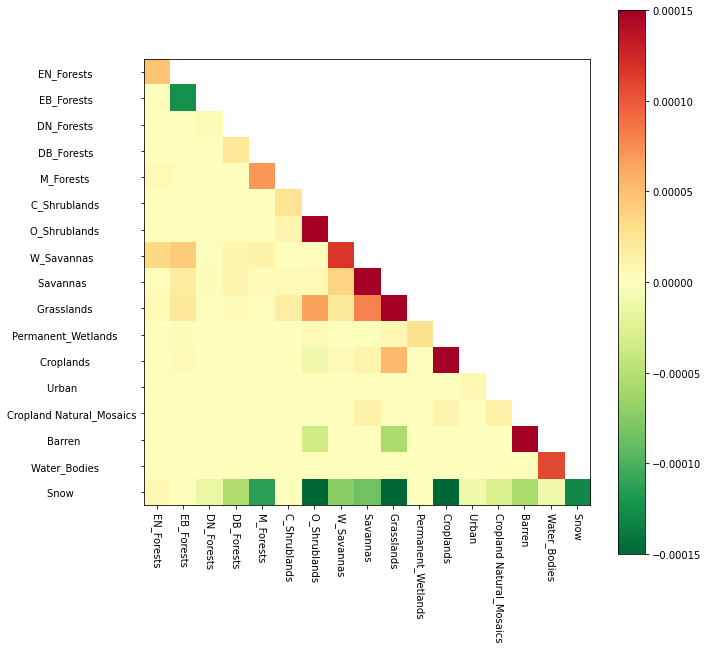

In [8]:
dif_al_tranf=np.nansum(dif_al.reshape(-1,18,18),axis=0)
dif_al_tranf=dif_al_tranf/np.sum(transf)
dif_al_tranf=np.delete(dif_al_tranf,14,axis=0)
dif_al_tranf=np.delete(dif_al_tranf,14,axis=1)


dif_al_tranf2=np.zeros((17,17))
for x in range(17):
    for y in range(17):
        dif_al_tranf2[x,y]=(dif_al_tranf[y,x]+dif_al_tranf[x,y])
        dif_al_tranf2[y,x]=np.nan
for i in range(17):
    dif_al_tranf2[i,i]=dif_al_tranf[i,i]

ll=[type_code[i] for i in range(18) if i!=14]


initial_cmap = cm.get_cmap('RdYlGn')
reversed_cmap = initial_cmap.reversed()
#x to y 减去y to x
plt.figure(figsize=(10,10))
plt.imshow(dif_al_tranf2,vmax=0.00015,vmin=-0.00015,cmap=reversed_cmap)
plt.yticks([i for i in range(17)],ll)
plt.xticks([i for i in range(17)],ll)
plt.xticks(rotation=-90)
plt.colorbar()
plt.show()

In [9]:
def to_log(k):
    k=k*1e7
    if np.isnan(k):
        return np.nan
    else:
        if k>=0:
            k=np.log10(k)
            if k<0:
                k=0
            return k
        else:
            k=np.log10(k*(-1))
            if k<0:
                k=0
            return -k
dif_al_tranf3=dif_al_tranf2.copy()
for x in range(17):
    for y in range(17):
        dif_al_tranf3[x,y]=to_log(dif_al_tranf3[x,y])
dif_al_tranf4=dif_al_tranf2.copy()
dif_al_tranf4=np.round(dif_al_tranf4*1e7)
# dif_al_tranf4=dif_al_tranf4.astype(np.int32)


In [10]:
[dif_al_tranf2[i,i] for i in range(17)]

[4.6688266593264416e-05,
 -0.0001252843940164894,
 -5.1885876928281505e-06,
 2.148148269043304e-05,
 7.01106182532385e-05,
 2.4727711206651293e-05,
 0.0009973946725949645,
 0.00011603541497606784,
 0.00024068757193163037,
 0.00077958864858374,
 2.5992423616116866e-05,
 0.0002538661065045744,
 6.354770448524505e-06,
 1.2288625839573797e-05,
 0.00018111872486770153,
 0.00010750668297987431,
 -0.0001296342961722985]

In [11]:
data_m=torch.load('/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=2]=np.nan
data_m=month_fill(data_m,mask_t>=2)
data_y=np.nanmean(data_m,axis=0)
transf=np.nansum(data_y,axis=0)
transf=np.nansum(transf,axis=0)
transf2=transf.copy()
transf22=np.zeros((18,18))
for i in range(18):
    transf22[i,i]=0
for x in range(18):
    for y in range(18):
        transf22[x,y]=(transf2[y,x]-transf2[x,y])
        transf22[y,x]=0
# for i in range(18):
#     transf22[i,i]=transf2[i,i]
transf22[transf22==0]=np.nan
transf3=np.zeros((17,17))
transf3[:14,:14]=transf22[:14,:14]
transf3[14:,:14]=transf22[15:,:14]

transf3[:14,14:]=transf22[:14,15:]
transf3[14:,14:]=transf22[15:,15:]
box_indices=[]
for x in range(17):
    for y in range(17):  
        if transf3[x,y]<0:
          box_indices.append((x,y))  

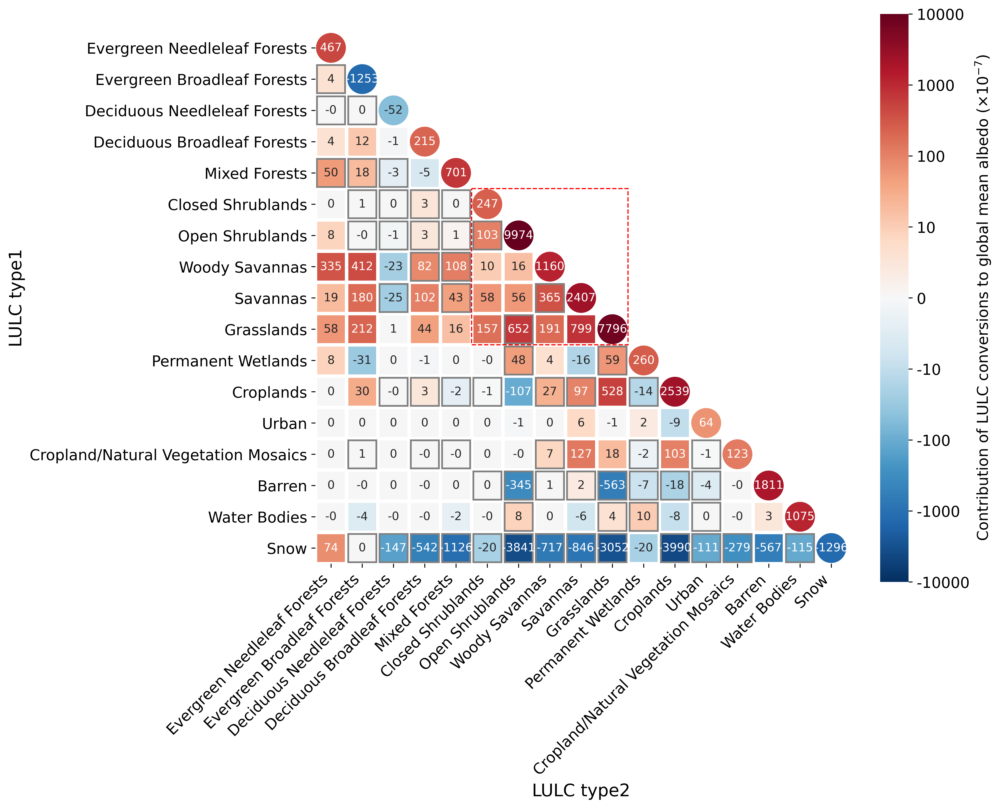

In [25]:
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
import seaborn as sns
names=['Evergreen Needleleaf Forests',
 'Evergreen Broadleaf Forests',
 'Deciduous Needleleaf Forests',
 'Deciduous Broadleaf Forests',
 'Mixed Forests',
 'Closed Shrublands',
 'Open Shrublands',
 'Woody Savannas',
 'Savannas',
 'Grasslands',
 'Permanent Wetlands',
 'Croplands',
 'Urban',
 'Cropland/Natural Vegetation Mosaics',
 'Barren',
 'Water Bodies',
 'Snow']
def heatmap_with_boxes(data, box_indices, ax=None, **kwargs):
    if not ax:
        ax = plt.gca()
    # ax.imshow(data, **kwargs)

    rows, cols = data.shape

    for i, j in box_indices:
        # 计算框的左下角坐标
        x = j
        y = i

        # 创建框对象并添加到图表中
        rect = Rectangle((x+0.05, y+0.05), 1-0.1, 1-0.1, linewidth=1.5, edgecolor='gray', facecolor='none')
        ax.add_patch(rect)

    ax.set_aspect('equal', adjustable='box')
def heatmap_with_c(data, box_indices, ax=None, **kwargs):
    if not ax:
        ax = plt.gca()
    # ax.imshow(data, **kwargs)

    rows, cols = data.shape
    cmap = plt.get_cmap('RdBu_r')
    norm = plt.Normalize(vmin=-4, vmax=4)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    for i, j in box_indices:
        # 计算框的左下角坐标
        x = j
        y = i


        value = data[x,y]
        color = sm.to_rgba(value)
        # 创建框对象并添加到图表中
        rect = Circle((x+0.5, y+0.5), 0.45, linewidth=1.5, edgecolor=color, facecolor=color)
        rect2 = Rectangle((x+0.05, y+0.05), 1, 1, linewidth=1.5,  facecolor='white')
        ax.add_patch(rect2)
        ax.add_patch(rect)
        

    ax.set_aspect('equal', adjustable='box')
f, ax = plt.subplots(figsize=(12, 10),dpi=600)
sns.heatmap(dif_al_tranf3, ax=ax,vmin=-4,vmax=4,fmt='g',
            annot_kws={"fontsize":10},square=True,cmap='RdBu_r',
            annot=dif_al_tranf4,linewidths=3,cbar=True)

# ax.set_title('Contribution of LULC conversions to global mean albedo') #plt.title('热图'),均可设置图片标题
ax.set_ylabel('LULC type1',fontsize=15)  #设置纵轴标签
ax.set_xlabel('LULC type2',fontsize=15)  #设置横轴标签
plt.yticks([i+0.5 for i in range(17)],names)
plt.xticks([i+0.5 for i in range(17)],names)
plt.yticks(rotation=360, horizontalalignment='right',fontsize=13)
plt.xticks(rotation=45, horizontalalignment='right',fontsize=13)
cbar = ax.collections[0].colorbar
cbar.set_ticks([-4,-3,-2,-1, 0,1,2,3, 4])
cbar.set_ticklabels(['-10000','-1000','-100','-10', '0','10','100','1000', '10000'],fontsize=13)
cbar.set_label(r"Contribution of LULC conversions to global mean albedo ($\times 10^{-7}$)",fontsize=13)
# box_indices = [(2, 2), (3, 3)]

# 在指定位置添加框
heatmap_with_c(dif_al_tranf3, [(i,i) for i in range(17)], ax=ax)
heatmap_with_boxes(dif_al_tranf3, box_indices, ax=ax)

# plt.axhline(y=5, color='r', linestyle='--', linewidth=1)
# plt.axhline(y=10, color='r', linestyle='--', linewidth=1)
# plt.axvline(x=5, color='r', linestyle='--', linewidth=1)
# plt.axvline(x=10, color='r', linestyle='--', linewidth=1)
rect = Rectangle((5, 5), 5, 5, linestyle='--',linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)
# plt.colorbar(ticks=['10000','1000','100','10','0','-10','-100','-1000','-10000'])
#设置坐标字体方向，通过rotation参数可以调节旋转角度
# label_y = ax.get_yticklabels(names)
# # plt.setp(names, rotation=360, horizontalalignment='right')
# label_x = ax.get_xticklabels(names)
# plt.setp(names, rotation=45, horizontalalignment='right')

plt.tight_layout()
f.savefig('./figure/albedo_contribution_kernel_bigfrontsize.pdf',dpi=600)
plt.show()

In [ ]:
from tool import *
data_m=torch.load('/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=1]=np.nan
data_m=month_fill(data_m,mask_t>=1)
data_y=np.nanmean(data_m,axis=0)
transf=np.nansum(data_y,axis=0)
transf=np.nansum(transf,axis=0)
dif_al=[]
for m in range(12):
    exp1_2020=np.expand_dims(albedo_all[m,-1],0).repeat(18,axis=0)
    exp0_2001=np.expand_dims(albedo_all[m,0],1).repeat(18,axis=1)
    dif_al_m=(exp1_2020-exp0_2001).transpose((2,3,0,1))*data_m[m]
    dif_al.append(dif_al_m*mt[m]/365/24/3600)
dif_al=np.stack(dif_al)
dif_al_tranf=np.nansum(dif_al.reshape(-1,18,18),axis=0)
print('delta albedo:',np.nansum(dif_al)/np.sum(transf))

k=[]
# a=np.sum(transf)
for i in range(18):
    k.append(dif_al_tranf[i,i]/transf[i,i])
    transf[i,i]=0
    dif_al_tranf[i,i]=0
a2=0
for i in range(17):
    a2+=transf[i,-1]
    a2+=transf[-1,i]
    transf[i,-1]=0
    transf[-1,i]=0
d2=0
for i in range(17):
    d2+=dif_al_tranf[i,-1]
    d2+=dif_al_tranf[-1,i]
    dif_al_tranf[i,-1]=0
    dif_al_tranf[-1,i]=0
k.append(d2/a2)


k.append(dif_al_tranf.sum()/transf.sum())
k

delta albedo: 0.0014960914


[0.003982863,
 -0.001627128,
 -0.004203711,
 0.0015425258,
 0.002995313,
 0.010560449,
 0.015041981,
 0.002453868,
 0.0030944909,
 0.0050103813,
 0.0037695454,
 0.003947073,
 0.0012803616,
 0.0022934598,
 nan,
 0.0014144001,
 0.0058493335,
 -0.00088645663,
 -0.06193592213698036,
 0.003231624]

In [ ]:
from tool import *
#18 nc area+change snow+change other
data_m=torch.load('/data/hk/albedo/confuse_matrix/confuse_matrix_2020.pth')
mask_t=np.expand_dims(mask[:,0,:],0).repeat(18,axis=0).transpose((1,3,4,0,2))
data_m[mask_t>=2]=np.nan
data_m=month_fill(data_m,mask_t>=2)
data_y=np.nanmean(data_m,axis=0)
transf=np.nansum(data_y,axis=0)
transf=np.nansum(transf,axis=0)

k=[]
a=np.sum(transf)
for i in range(18):
    k.append(transf[i,i])
a2=0
for i in range(17):
    a2+=transf[i,-1]
    a2+=transf[-1,i]
k.append(a2)
a-=np.array(k).sum()
k.append(a)
k

[1659557.2,
 11387740.0,
 171762.56,
 2046906.0,
 3310774.5,
 344822.56,
 9312990.0,
 6771352.5,
 11233022.0,
 22403706.0,
 962998.3,
 9303391.0,
 729820.06,
 786312.8,
 0.0,
 18886132.0,
 2708091.2,
 23792816.0,
 4123181.134765625,
 17963536.052734375]

In [ ]:
delta_a=[0.003982863,
 -0.001627128,
 -0.004203711,
 0.0015425258,
 0.002995313,
 0.010560449,
 0.015041981,
 0.002453868,
 0.0030944909,
 0.0050103813,
 0.0037695454,
 0.003947073,
 0.0012803616,
 0.0022934598,
 0.0014144001,
 0.0058493335,
 -0.00088645663,
 -0.06193592213698036,
 0.003231624]

In [ ]:
area=[1659557.2,
 11387740.0,
 171762.56,
 2046906.0,
 3310774.5,
 344822.56,
 9312990.0,
 6771352.5,
 11233022.0,
 22403706.0,
 962998.3,
 9303391.0,
 729820.06,
 786312.8,
 18886132.0,
 2708091.2,
 23792816.0,
 4123181.134765625,
 17963536.052734375]

In [ ]:
label=['EN_Forests',
 'EB_Forests',
 'DN_Forests',
 'DB_Forests',
 'M_Forests',
 'C_Shrublands',
 'O_Shrublands',
 'W_Savannas',
 'Savannas',
 'Grasslands',
 'Permanent_Wetlands',
 'Croplands',
 'Urban',
 'Cropland Natural_Mosaics',
 'Barren',
 'Water_Bodies',
 'Snow',
 'Snow coversion',
 'Other conversion']

In [ ]:
import pandas as pd
ppd=pd.DataFrame.from_dict({'label':label,'area':area,'delta_a':delta_a}) 

In [ ]:
ppd=ppd.sort_values('area',ascending=False)
# ppd['index']=list(range(19))
ppd['index']=[0,3,4,2,5,6,7,8,9,1,10,11,12,13,14,15,16,17,18]
ppd=ppd.sort_values('index')

In [ ]:
ppd

,label,area,delta_a,index
16,Snow,2.379282e+07,-0.000886,0
17,Snow coversion,4.123181e+06,-0.061936,1
18,Other conversion,1.796354e+07,0.003232,2
9,Grasslands,2.240371e+07,0.005010,3
14,Barren,1.888613e+07,0.001414,4
1,EB_Forests,1.138774e+07,-0.001627,5
8,Savannas,1.123302e+07,0.003094,6
6,O_Shrublands,9.312990e+06,0.015042,7
11,Croplands,9.303391e+06,0.003947,8
7,W_Savannas,6.771352e+06,0.002454,9


In [ ]:
import squarify
import matplotlib.pyplot as plt
from tool import *
import matplotlib as mpl
plt.figure(figsize=(20,15),dpi=600)



min_diff = -0.01
max_diff = 0.01

cmap = mpl.cm.RdBu_r # 蓝色为正，红色为负
norm = mpl.colors.TwoSlopeNorm(vmin=min_diff, vcenter=0, vmax=max_diff)  # 强制0为中点的正太分布渐变色

colors = [cmap(norm(value)) for value in ppd['delta_a']]
    
    
    
# colors = [plt.cm.Spectral(i/float(len(size))) for i in range(len(size))]
squarify.plot(sizes=ppd['area'],
            #   label=ppd['label'],
              color=colors,
              edgecolor="white",
              linewidth=5,
              text_kwargs={'fontsize': 22}
              )#sizes的个数说明了分支数的个数，有几就是几，label显示标签，colors颜色，不同的取值有不同的颜色，alpha表示颜色的淡化程度
# plt.colorbar()
plt.title(r'LULC area and $\Delta \alpha$',fontsize=30)
# plt.legend()
plt.axis('off')#不显示坐标轴
plt.savefig('./figure/rectangle_tree_kernel.pdf',dpi=600)
plt.show()


